/opt/anaconda3/envs/test/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/opt/anaconda3/envs/test/lib/python3.12/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)
/opt/anaconda3/envs/test/lib/python3.12/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/opt/anaconda3/envs/test/lib/python3.12/site-packages/anndata/__init__.

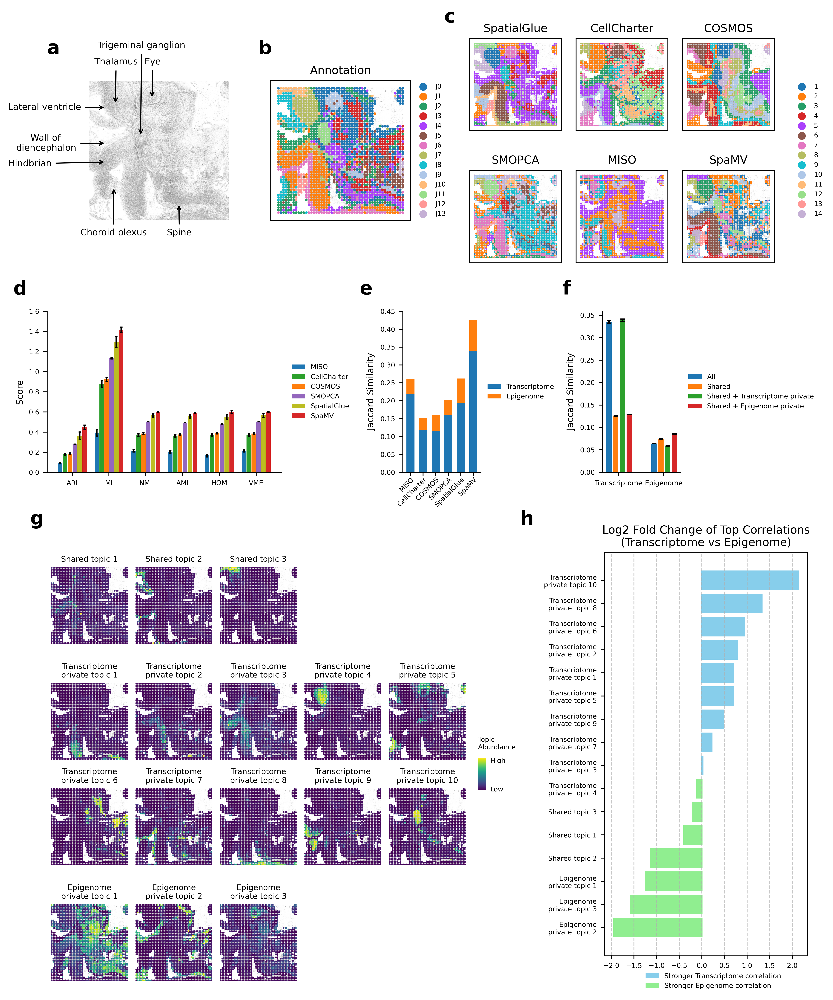

In [1]:
import math
import textwrap
import matplotlib
import warnings
import sys
import os
# Get the current working directory
current_dir = os.getcwd()
# Add the parent directory to sys.path
sys.path.insert(0, os.path.dirname(current_dir))
from SpaMV.utils import compute_gene_topic_correlations

warnings.filterwarnings("ignore")
import numpy as np
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.gridspec import GridSpec
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from matplotlib.patches import Patch
font = {'size': 6}
plt.rc('font', size=8)
plt.rc('axes', titlesize=10)
plt.rc('axes', labelsize=8)
plt.rc('xtick', labelsize=6)
plt.rcParams.update({'font.size': 5})
matplotlib.rc('font', **font)
dataset = 'Mouse_Embryo'
# load mouse embryo dataset
data_rna = sc.read_h5ad('../Dataset/' + dataset + '/adata_RNA.h5ad')

cluster_size = 20
dr_size = 50
width = 10.5
height = 13
gt_scale = {'top':1 - 1/height, 'bottom':1 - 4/height, 'left':0.1, 'right': .48}
clustering_scale = {'top':1 - 1/height, 'bottom':1 - 4/height, 'left': .55, 'right': .95}
score_scale = {'top':1 - 4.5/height, 'bottom':1 - 6.5/height, 'left': 0.05, 'right': .8}
dr_scale = {'top': 1-7.5/height, 'bottom': 1-13/height, 'left': .05, 'right': .55}
dr_colorbar_scale = {'top': 1-10.05/height, 'bottom': 1-10.45/height, 'left': .56, 'right':.57}
dr_score_scale = {'top': 1-7.5/height, 'bottom': 1-12.5/height, 'left': .71, 'right': .95}

fig = plt.figure(figsize=(width, height), dpi=500)
###############################################################################################################################
# plot clustering results
spec_gt = GridSpec(1, 2, wspace=.3)
spec_gt.update(**gt_scale)
image = plt.subplot(spec_gt[0, 0])
sq.pl.spatial_scatter(data_rna, ax=image, frameon=False)
fontsize = 8
image.annotate('Thalamus', xy=(320, 300), xytext=(60, -200), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('Trigeminal ganglion', xy=(630, 690), xytext=(100, -400), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('Eye', xy=(770, 230), xytext=(675, -200), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('Lateral ventricle', xy=(210, 330), xytext=(-1000, 357), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('     Wall of\ndiencephalon', xy=(210, 770), xytext=(-900, 860), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('Hindbrian', xy=(210, 1000), xytext=(-1000, 1050), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('Choroid plexus', xy=(300, 1300), xytext=(-110, 1900), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
image.annotate('Spine', xy=(1100, 1500), xytext=(950, 1900), arrowprops=dict(arrowstyle='->', color='black'), fontsize=fontsize, color='black')
gt = plt.subplot(spec_gt[0, 1])
sc.pl.spatial(data_rna, ax=gt, title='Annotation', color='cluster', show=False)
gt.get_xaxis().set_visible(False)
gt.get_yaxis().set_visible(False)

spec_clustering = GridSpec(2, 4, width_ratios=[1, 1, 1, .2])
spec_clustering.update(**clustering_scale)

f_dict = {}
f_dict['SpatialGlue'] = plt.subplot(spec_clustering[0, 0])
f_dict['CellCharter'] = plt.subplot(spec_clustering[0, 1])
f_dict["COSMOS"] = plt.subplot(spec_clustering[0, 2])
f_dict['SMOPCA'] = plt.subplot(spec_clustering[1, 0])
f_dict['MISO'] = plt.subplot(spec_clustering[1, 1])
f_dict['SpaMV'] = plt.subplot(spec_clustering[1, 2])
legend = plt.subplot(spec_clustering[:, 3])

data_methods = {}
for method in ['COSMOS', 'SpaMV', 'CellCharter', 'SpatialGlue', 'MISO', 'SMOPCA']:
    data_methods[method] = sc.read_h5ad('../Results/' + dataset + '/' + method + '.h5ad')
    data_methods[method].obsm['spatial'] = data_rna[data_methods[method].obs_names].obsm['spatial']
    data_methods[method].uns['spatial'] = data_rna[data_methods[method].obs_names].uns['spatial']
    sc.pl.spatial(data_methods[method], color=method, ax=f_dict[method], show=False)

handles, labels = f_dict['SpaMV'].get_legend_handles_labels()
legend.legend(handles, labels, loc='center left', frameon=False, ncol=1)
legend.axis('off')
for f in f_dict.values():
    f.get_legend().remove()
    f.axes.get_xaxis().set_visible(False)
    f.axes.get_yaxis().set_visible(False)

###############################################################################################################################
# plot clutering evaluation results
# plot supervised results
spec_score = GridSpec(1, 5, width_ratios=[3, 1, 1, 1, 1])
spec_score.update(**score_scale)
supervised = plt.subplot(spec_score[0, 0])
evaluation_spamv = pd.read_csv('../Results/' + dataset + '/Evaluation_SpaMV.csv')
evaluation_miso = pd.read_csv('../Results/' + dataset + '/Evaluation_MISO.csv')
evaluation_cosmos = pd.read_csv('../Results/' + dataset + '/Evaluation_COSMOS.csv')
evaluation_spatialglue = pd.read_csv('../Results/' + dataset + '/Evaluation_SpatialGlue.csv')
evaluation_cellcharter = pd.read_csv('../Results/' + dataset + '/Evaluation_CellCharter.csv')
evaluation_smopca = pd.read_csv('../Results/' + dataset + '/Evaluation_SMOPCA.csv')

melted_df = evaluation_spamv
for df in [evaluation_miso, evaluation_cosmos, evaluation_spatialglue, evaluation_cellcharter, evaluation_smopca]:
    melted_df = pd.merge(melted_df, df, how='outer')

melted_df = melted_df[melted_df['Dataset'] == dataset]
melted_df = melted_df.drop(['Dataset', 'jaccard 1', 'jaccard 2', 'moran I', 'moranI', 'Average', 'Jaccard 1', 'Jaccard 2'], axis=1)

metrics = ['AMI', 'ARI', 'HOM', 'MI', 'NMI', 'VME']  # your metrics
methods = ['MISO', 'CellCharter', 'SMOPCA', 'COSMOS', 'SpatialGlue', 'SpaMV']  # your methods
melted_df = melted_df[melted_df['method'].isin(methods)]

x = np.arange(len(metrics))  # the label locations
width = 0.15  # the width of the bars

# Plot bars for each method
# Calculate mean and standard deviation for each algorithm and metric
df_means = melted_df.groupby('method').mean().reset_index()
df_errors = melted_df.groupby('method').std().reset_index()

# Reshape the DataFrames for plotting
df_means_melted = df_means.melt(id_vars='method', var_name='Metric', value_name='Mean')
df_errors_melted = df_errors.melt(id_vars='method', var_name='Metric', value_name='Std')

# Merge the dataframes to include errors
df_combined = pd.merge(df_means_melted, df_errors_melted, on=['method', 'Metric'])

# Define the number of algorithms and metrics
algorithms = df_combined['method'].unique()
metrics = df_combined['Metric'].unique()
bar_width = 0.12  # Width of the bars
cat_width = .8

colors = {'MISO': '#1f77b4', 'COSMOS': '#ff7f0e', 'spaMultiVAE': '#8c564b', 'CellCharter': '#2ca02c', 'SMOPCA': '#9467bd', 'SpatialGlue': '#bcbd22', 'SpaMV': '#d62728'}
# Plotting
for i, algorithm in enumerate(['MISO', 'CellCharter', 'COSMOS', 'SMOPCA', 'SpatialGlue', 'SpaMV']):
    algo_data = df_combined[df_combined['method'] == algorithm]
    offset = cat_width * i / 6 - (.986-.12*6)/.8
    supervised.bar(x + offset, algo_data['Mean'], yerr=algo_data['Std'], width=bar_width, label=algorithm, capsize=1, color=colors[algorithm])

# Customize the plot
supervised.set_ylabel('Score')
supervised.set_xticks(x)
supervised.set_xticklabels(metrics)
supervised.set_ylim([0, 1.6])
supervised.legend()

# Remove spines
supervised.spines['right'].set_visible(False)
supervised.spines['top'].set_visible(False)
supervised.legend(bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)


# plot unsupervised results
unsupervised = plt.subplot(spec_score[0, 2])
melted_df = evaluation_spamv
evaluation_smopca['jaccard 1'] = evaluation_smopca['Jaccard 1']
evaluation_smopca['jaccard 2'] = evaluation_smopca['Jaccard 2']
for df in [evaluation_miso, evaluation_cosmos, evaluation_spatialglue, evaluation_cellcharter, evaluation_smopca]:
    melted_df = pd.merge(melted_df, df, how='outer')

melted_df = melted_df[melted_df['Dataset'] == dataset]
melted_df = melted_df.drop(['AMI', 'ARI', 'HOM', 'MI', 'NMI', 'VME', 'Dataset', 'moranI', 'moran I', 'Average', 'Jaccard 1', 'Jaccard 2'], axis=1)
methods = ['MISO', 'CellCharter', 'COSMOS', 'SMOPCA', 'SpatialGlue', 'SpaMV', 'SpaMV (Shared)', 'SpaMV (Transcriptomics related)', 'SpaMV (Epigenomics related)']
mean_scores = melted_df.groupby('method').mean().reset_index()
std_scores = melted_df.groupby('method').std().reset_index()

# Reshape the DataFrames for plotting
df_means_melted = mean_scores.melt(id_vars='method', var_name='Metric', value_name='Mean')
df_errors_melted = std_scores.melt(id_vars='method', var_name='Metric', value_name='Std')

# Merge the dataframes to include errors
df_combined = pd.merge(df_means_melted, df_errors_melted, on=['method', 'Metric'])

x = np.arange(2)  # the label locations
bar_width = 0.64  # Width of the bars
colors = {'MISO': '#1f77b4', 'COSMOS': '#ff7f0e', 'spaMultiVAE': '#8c564b', 'CellCharter': '#2ca02c', 'SMOPCA': '#9467bd', 'SpatialGlue': '#bcbd22', 'SpaMV': '#d62728'}
ms = ['MISO', 'CellCharter', 'COSMOS', 'SMOPCA', 'SpatialGlue', 'SpaMV']
values = {}
for o in ['Transcriptome', 'Epigenome']:
    values[o] = []
    for method in ['MISO', 'CellCharter', 'COSMOS', 'SMOPCA', 'SpatialGlue']:
        if o == 'Transcriptome':
            values[o].append(melted_df[melted_df['method'] == method]['jaccard 1'].mean())
        else:
            values[o].append(melted_df[melted_df['method'] == method]['jaccard 2'].mean())
    if o == 'Transcriptome':
        values[o].append(melted_df[melted_df['method'] == 'SpaMV (Transcriptomics related)']['jaccard 1'].mean())
    else:
        values[o].append(melted_df[melted_df['method'] == 'SpaMV (Epigenomics related)']['jaccard 2'].mean())

bottom = np.zeros(len(ms))

for boolean, weight_count in values.items():
    p = unsupervised.bar(ms, weight_count, bar_width, label=boolean, bottom=bottom)
    bottom += weight_count

# Add labels and title
unsupervised.set_ylabel('Jaccard Similarity')
unsupervised.legend(bbox_to_anchor=(1.05, 0.5), loc='center left', borderaxespad=0, frameon=False)
unsupervised.axes.set_xticklabels(labels=ms, rotation=45, ha='right', rotation_mode='anchor')
unsupervised.axes.xaxis.set_tick_params(pad=0)
unsupervised.set_ylim([0, .45])
# unsupervised.set_ylim([0, ymax])

# Remove the top and right spines
unsupervised.spines['top'].set_visible(False)
unsupervised.spines['right'].set_visible(False)

# Remove the x-axis label
unsupervised.set_xlabel('')  # Set the x-axis label to an empty string

# plot unsupervised results
unsupervised_spamv = plt.subplot(spec_score[0, 4])
melted_df = evaluation_spamv
evaluation_smopca['jaccard 1'] = evaluation_smopca['Jaccard 1']
evaluation_smopca['jaccard 2'] = evaluation_smopca['Jaccard 2']
for df in [evaluation_miso, evaluation_cosmos, evaluation_spatialglue, evaluation_cellcharter, evaluation_smopca]:
    melted_df = pd.merge(melted_df, df, how='outer')

melted_df = melted_df[melted_df['Dataset'] == dataset]
melted_df = melted_df.drop(['AMI', 'ARI', 'HOM', 'MI', 'NMI', 'VME', 'Dataset', 'moranI', 'moran I', 'Average', 'Jaccard 1', 'Jaccard 2'], axis=1)
methods = ['SpaMV', 'SpaMV (Shared)', 'SpaMV (Transcriptomics related)', 'SpaMV (Epigenomics related)']
mean_scores = melted_df.groupby('method').mean().reset_index()
std_scores = melted_df.groupby('method').std().reset_index()

# Reshape the DataFrames for plotting
df_means_melted = mean_scores.melt(id_vars='method', var_name='Metric', value_name='Mean')
df_errors_melted = std_scores.melt(id_vars='method', var_name='Metric', value_name='Std')

# Merge the dataframes to include errors
df_combined = pd.merge(df_means_melted, df_errors_melted, on=['method', 'Metric'])

x = np.arange(2)  # the label locations

cat_width = .6
width = cat_width / 4 * .8 # the width of the bars
colors = {'MISO': '#1f77b4', 'COSMOS': '#ff7f0e', 'spaMultiVAE': '#8c564b', 'CellCharter': '#2ca02c', 'SMOPCA': '#9467bd', 'SpatialGlue': '#bcbd22', 'SpaMV': '#d62728'}
# Plot bars for each method
for i, method in enumerate(methods):
    offset = cat_width * i / 4 - (.65-width*4)/.8
    algo_data = df_combined[df_combined['method'] == method]
    if method == 'SpaMV (Transcriptomics related)':
        label = 'Shared + Transcriptome private'
    elif method == 'SpaMV (Epigenomics related)':
        label = 'Shared + Epigenome private'
    elif method == 'SpaMV (Shared)':
        label = 'Shared'
    else:
        label = 'All'
    # unsupervised.bar(x + offset, mean_scores.loc[method], width, label=label, color=color, alpha=alpha, hatch=hatch)
    unsupervised_spamv.bar(x + offset, algo_data['Mean'], yerr=algo_data['Std'], width=width, capsize=2, label=label)

# Customize the plot
unsupervised_spamv.set_ylabel('Jaccard Similarity')
unsupervised_spamv.set_xticks(x)
unsupervised_spamv.set_xticklabels(['Transcriptome', 'Epigenome'])
unsupervised_spamv.legend()
# Remove spines
unsupervised_spamv.spines['right'].set_visible(False)
unsupervised_spamv.spines['top'].set_visible(False)
unsupervised_spamv.legend(bbox_to_anchor=(1.02, 0.5), loc='center left', frameon=False)

###############################################################################################################################
# plot dimensionality reduction results
spec_dr = GridSpec(6, 5, hspace=0, wspace=0, height_ratios=[1, .1, 1, 1, .1, 1])
spec_dr.update(**dr_scale)
z = pd.read_csv('../Results/' + dataset + '/SpaMV_z.csv', index_col=0)
col_dict = {}
si = 1
oi = 1
ti = 1
for topic in z.columns:
    if 'Shared' in topic:
        col_dict[topic] = topic.rsplit(' ', 1)[0] + ' ' + str(si)
        si += 1
    elif 'Transcriptomics' in topic:
        col_dict[topic] = topic.rsplit(' ', 1)[0] + ' ' + str(oi)
        oi += 1
    else:
        col_dict[topic] = topic.rsplit(' ', 1)[0] + ' ' + str(ti)
        ti += 1
z = z.rename(columns=col_dict)

# scaler = MinMaxScaler()
# z = pd.DataFrame(scaler.fit_transform(z), columns=z.columns, index = z.index)
data_rna = data_rna[z.index]
data_rna.obs[z.columns] = z.values
def auto_break_title(title, max_length_per_line=16):
    """
    Automatically break a title into multiple lines if it exceeds the threshold length.

    Args:
        title (str): The original title
        max_length_per_line (int): Maximum characters per line before breaking

    Returns:
        str: Title with line breaks added where appropriate
    """
    words = title.split()
    lines = []
    current_line = []
    current_length = 0

    for word in words:
        # Check if adding this word would exceed the max length
        if current_length + len(word) + len(current_line) <= max_length_per_line:
            current_line.append(word)
            current_length += len(word)
        else:
            # Start a new line
            lines.append(' '.join(current_line))
            current_line = [word]
            current_length = len(word)

    # Add the last line
    if current_line:
        lines.append(' '.join(current_line))

    # Join lines with newline character
    return '\n'.join(lines)
f_dict = {}
sj = 0
tj = 0
ej = 0
for topic in z.columns:
    label = topic
    if 'Transcriptomics' in topic:
        label = label.replace("Transcriptomics", "Transcriptome")
        if tj <=4:
            f_dict[topic] = plt.subplot(spec_dr[2, tj])
        else:
            f_dict[topic] = plt.subplot(spec_dr[3, tj - 5])
    elif 'Epigenomics' in topic:
        label = label.replace("Epigenomics", "Epigenome")
        f_dict[topic] = plt.subplot(spec_dr[5, ej])
    else:
        f_dict[topic] = plt.subplot(spec_dr[0, sj])
    if topic == 'Shared topic 1':
        sc.pl.spatial(data_rna, color=topic, ax=f_dict[topic], frameon=False, show=False, vmax='p100')
    else:
        sc.pl.spatial(data_rna, color=topic, ax=f_dict[topic], title=auto_break_title(label), frameon=False, show=False)
    f_dict[topic].set_title(auto_break_title(label), fontsize=7, pad=0)
        # sq.pl.spatial_scatter(data_rna, color=topic, ax=f_dict[topic], title=auto_break_title(topic), frameon=False)
    # sc.pl.spatial(data_rna, color=topic, ax=f_dict[topic], title=auto_break_title(topic), frameon=False, vmax='p99', show=False)
    f_dict[topic].axes.get_xaxis().set_visible(False)
    f_dict[topic].axes.get_yaxis().set_visible(False)
    sm = f_dict[topic].collections[0]
    f_dict[topic].collections[0].colorbar.remove()
    if 'Transcriptomics' in topic:
        tj += 1
    elif 'Epigenomics' in topic:
        ej += 1
    else:
        sj += 1

# plot common colorbar
spec_colorbar = GridSpec(1, 1)
spec_colorbar.update(**dr_colorbar_scale)
colorbar = plt.subplot(spec_colorbar[0, 0])
cb = plt.colorbar(sm, cax=colorbar)

# colorbar.set_yticks([])
vmin, vmax = .02, .45
# Define tick positions including intermediate ticks
num_ticks = 4  # Total number of ticks
ticks = np.linspace(vmin, vmax, num=num_ticks)

# Set the ticks on the colorbar
cb.outline.set_visible(False)
cb.set_ticks(ticks)

# Create labels where only the first and last are labeled
labels = ['Low'] + [''] * (num_ticks - 2) + ['High']

# Set these labels on the colorbar
cb.ax.set_yticklabels(labels)
cb.ax.tick_params(size=0)
colorbar.text(x=0, y=.7, s='Topic\nAbundance', va='center', ha='left', rotation=0)

# plot dimensionality reduction metrics results
spec_dr_scores = GridSpec(1, 1)
spec_dr_scores.update(**dr_score_scale)
dr_score = plt.subplot(spec_dr_scores[0, 0])
def plot_topic_correlation_ratio_multimodal(data, omics_names, z, ax, k_values=None):
    """
    Plot the log2 fold change of mean top-k correlations between modalities for each topic.

    Parameters
    ----------
    data_list : list
        List of AnnData objects, one for each modality
    omics_names : list
        List of strings containing names of each modality
    z : pandas.DataFrame
        Topic matrix where rows are cells and columns are topics
    k_values : dict or None
        Dictionary mapping modality names to their k values for top correlations
        If None, defaults to k=20 for RNA and k=5 for others
    figsize : tuple
        Figure size (width, height)
    """
    # Validate inputs
    if len(data) != len(omics_names):
        raise ValueError("Number of datasets must match number of omics names")
    if len(data) != 2:
        raise ValueError("This function currently supports exactly 2 modalities")

    # Set default k values if not provided
    if k_values is None:
        k_values = {name: 5 if name in ['Proteomics'] else 10 for name in omics_names}

    # Compute correlations for each modality
    modality_corrs = {}
    for data, name in zip(data, omics_names):
        corr_df, _ = compute_gene_topic_correlations(data, z)
        modality_corrs[name] = corr_df

    # Calculate mean top-k correlations for each modality
    topic_means = {name: [] for name in omics_names}

    for topic in z.columns:
        for name in omics_names:
            # Get top k correlations for this modality
            top_k_corrs = np.sort(modality_corrs[name][topic].values)[-k_values[name]:]
            topic_means[name].append(np.mean(top_k_corrs))

    # Calculate log2 fold change
    log2_fold_changes = np.log2(np.array(topic_means[omics_names[0]]) /
                               np.array(topic_means[omics_names[1]]))

    # Create DataFrame with results
    result_df = pd.DataFrame({
        'Topic': z.columns,
        'Log2 Fold Change': log2_fold_changes
    })

    # Sort by log2 fold change
    result_df = result_df.sort_values('Log2 Fold Change', ascending=True)

    # Create horizontal bar plot
    bars = ax.barh(range(len(result_df)), result_df['Log2 Fold Change'])

    # Color bars based on which modality has stronger correlation
    for i, bar in enumerate(bars):
        if result_df['Log2 Fold Change'].iloc[i] > 0:
            bar.set_color('skyblue')  # First modality stronger
        else:
            bar.set_color('lightgreen')  # Second modality stronger

    # Customize the plot
    plt.title(f'Log2 Fold Change of Top Correlations\n({omics_names[0]} vs {omics_names[1]})')

    def split_label(label, threshold=10):
       if len(label) <= threshold:
           return label

       words = label.split()
       current_line = ""
       broken_label = ""

       for word in words:
           if len(current_line) + len(word) + 1 > threshold:
               broken_label += current_line.strip() + '\n'
               current_line = word + " "
           else:
               current_line += word + " "

       broken_label += current_line.strip()  # Add the last line
       return broken_label

    new_labels = [split_label(label, threshold=18) for label in result_df['Topic']]
    for i in range(len(new_labels)):
        if 'Transcriptomics' in new_labels[i]:
            new_labels[i] = new_labels[i].replace("Transcriptomics", "Transcriptome")
        elif 'Epigenomics' in new_labels[i]:
            new_labels[i] = new_labels[i].replace("Epigenomics", 'Epigenome')
    # Set topic names as y-axis labels
    plt.yticks(range(len(result_df)), new_labels)

    label1 = f'Stronger {omics_names[0]} correlation'
    label2 = f'Stronger {omics_names[1]} correlation'

    legend_elements = [Patch(facecolor='skyblue', label=label1), Patch(facecolor='lightgreen', label=label2)]
    plt.legend(handles=legend_elements, loc='lower right', bbox_to_anchor=(.9, -.1), frameon=False)
    
    # Add grid for better readability
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    return plt.gcf()

sc.pp.filter_genes(data_rna, min_cells=math.ceil(data_rna.n_obs / 100))
data_rna = data_rna[:, (data_rna.X > 1).sum(0) > data_rna.n_obs / 100]
sc.pp.highly_variable_genes(data_rna, subset=False, n_top_genes=1000, flavor='seurat_v3')
sc.pp.normalize_total(data_rna)
sc.pp.log1p(data_rna)
data_atac = sc.read_h5ad('../Dataset/' + dataset + '/adata_ATAC.h5ad')
data_atac = data_atac[z.index]
sc.pp.highly_variable_genes(data_atac, n_top_genes=1000, subset=True, flavor='seurat')

plot_topic_correlation_ratio_multimodal([data_rna, data_atac], ['Transcriptome', 'Epigenome'], z, dr_score)
plt.tight_layout()
fs = 17
fig.text(.05, .9, 'a', fontsize=fs, fontweight='bold')
fig.text(.3, .9, 'b', fontsize=fs, fontweight='bold')
fig.text(.52, .93, 'c', fontsize=fs, fontweight='bold')
fig.text(.01, .67, 'd', fontsize=fs, fontweight='bold')
fig.text(.42, .67, 'e', fontsize=fs, fontweight='bold')
fig.text(.66, .67, 'f', fontsize=fs, fontweight='bold')
fig.text(.03, .45, 'g', fontsize=fs, fontweight='bold')
fig.text(.61, .45, 'h', fontsize=fs, fontweight='bold')
plt.savefig('../Figures/visualisation_3.pdf')
plt.show()